In [189]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
import pdb
import aspirin
from aspirin.data.load_data import load_data
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

In [133]:
plt.rcParams['figure.figsize'] = [20, 10]

In [3]:
data = load_data('../data/Data_Novartis_Datathon-Participants.csv')

> /home/frank/Documents/novartis_datathon/dudewheresmyaspirin/aspirin/data/load_data.py(8)load_data()
-> data = pd.read_csv(path, header=[0, 1, 2, 3], sep=';')
(Pdb) c


In [8]:
data = pd.read_csv('../data/Data_Novartis_Datathon-Participants.csv', header=[0, 1, 2, 3], sep=';')
data.columns = [col[3] for col in data.columns]
data = data[[col for col in data if 'Unnamed' not in col]]
data = data.rename(columns={' Country': 'Country'})

index_cols = ['Cluster', 'Brand Group', 'Country', 'Function']
date_cols = [col for col in data.columns if col not in index_cols]
data = pd.melt(data, id_vars=index_cols,value_vars=date_cols)
data['value'] = data['value'].apply(lambda x: float(x.replace(',', '.')) if isinstance(x, str) else x)


index_cols = ['Cluster', 'Brand Group', 'Country', 'variable']
data = pd.pivot_table(data, columns=['Function'], index=index_cols)
data.columns = [col[1] for col in data.columns]
data = data.reset_index()


import calendar
import datetime
month_dict = {v: k for k,v in enumerate(calendar.month_abbr)}

index_cols = ['Cluster', 'Brand Group', 'Country', 'Function', 'variable']

data['year'] = data['variable'].apply(lambda x: x.split(' ')[1])
data['month'] = data['variable'].apply(lambda x: x.split(' ')[0])
data['month_num'] = data['month'].map(month_dict)
data['date'] = data.apply(lambda x: pd.Timestamp(year=int(x['year']), month=int(x['month_num']), day=1), axis=1)
data = data.drop('variable', axis=1)

data = data.set_index(['Cluster', 'Brand Group', 'Country', 'date'])


In [59]:
countries = np.unique(data.index.get_level_values(2))
clusters = np.unique(data.index.get_level_values(0))
brand_groups = np.unique(data.index.get_level_values(1))
selected_brand_groups = ['Brand Group 17', 'Brand Group 24', 'Brand Group 30', 'Brand Group 31', 'Brand Group 36',
                         'Brand Group 41', 'Brand Group 51', 'Brand Group 73', 'Brand Group 90', 'Brand Group 96',
                         'Brand Group 97']

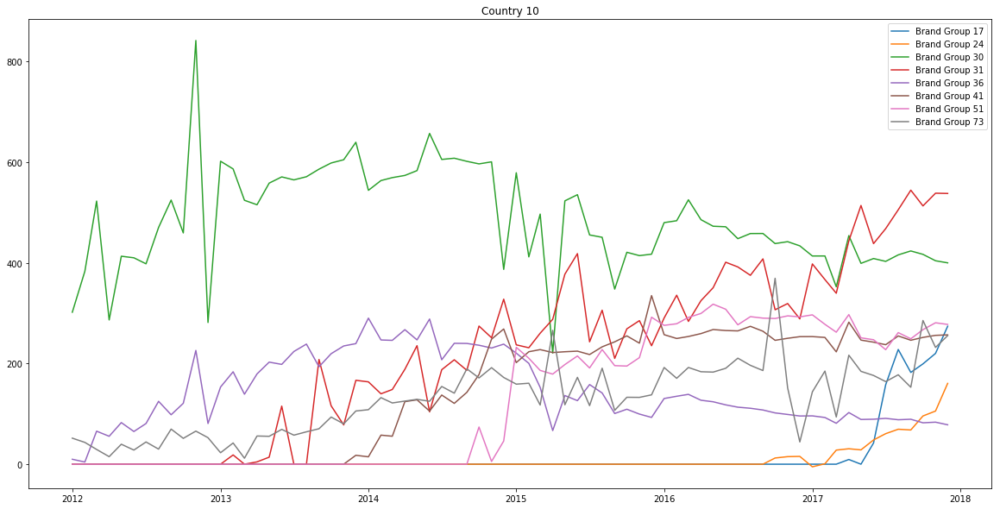

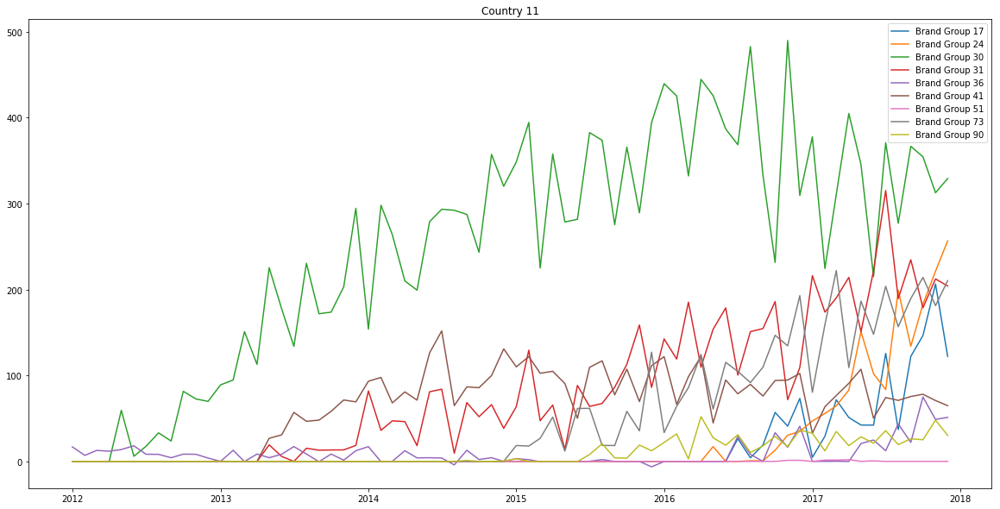

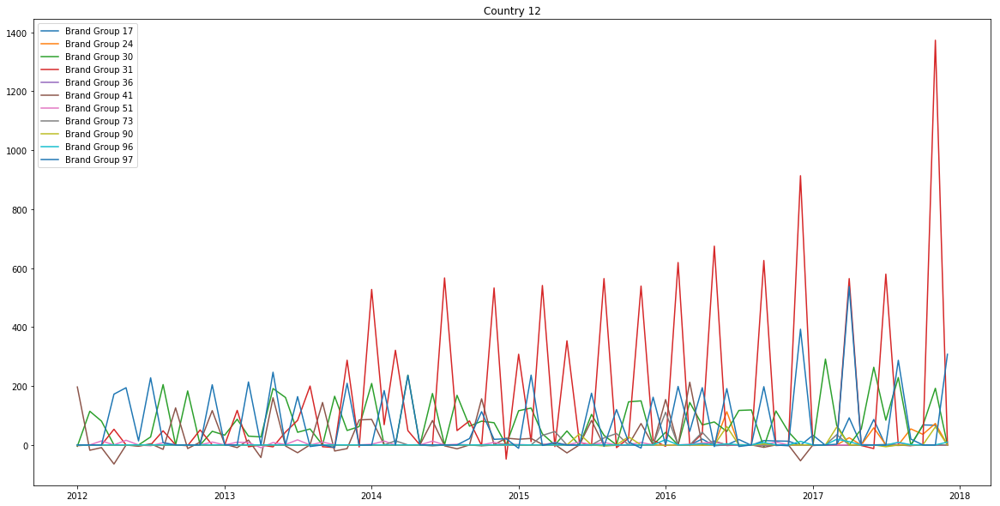

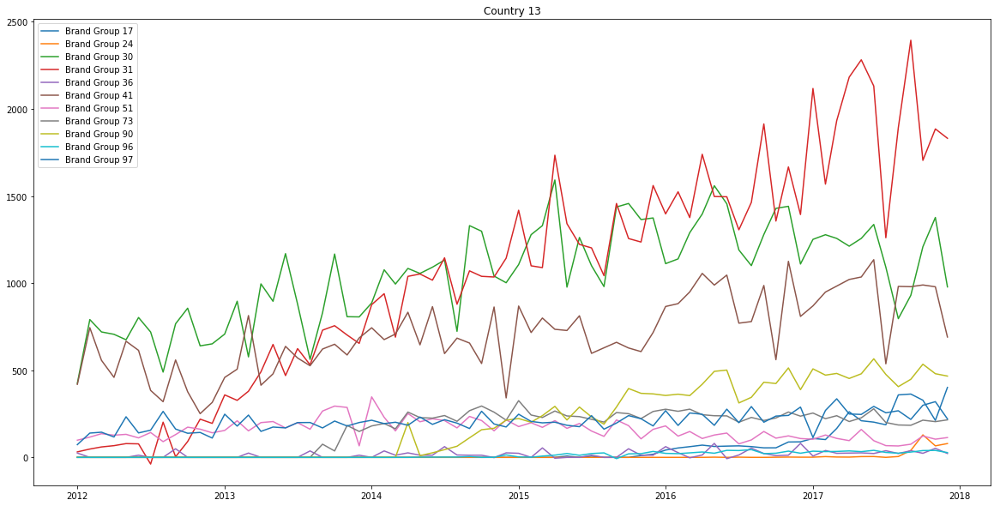

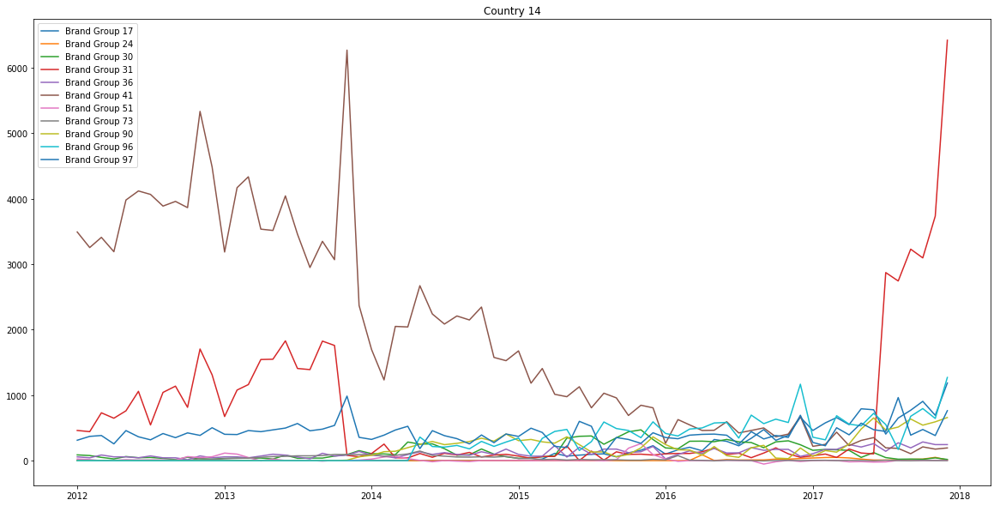

...

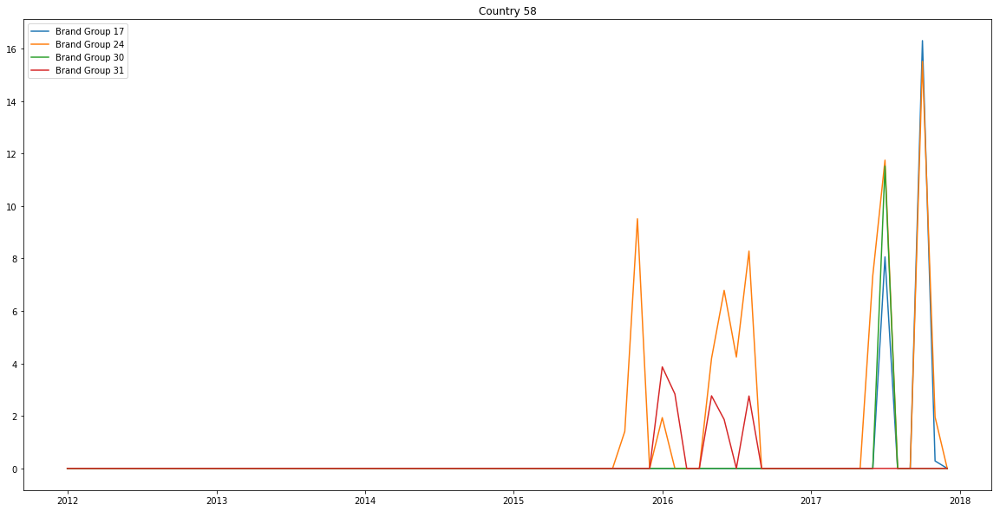

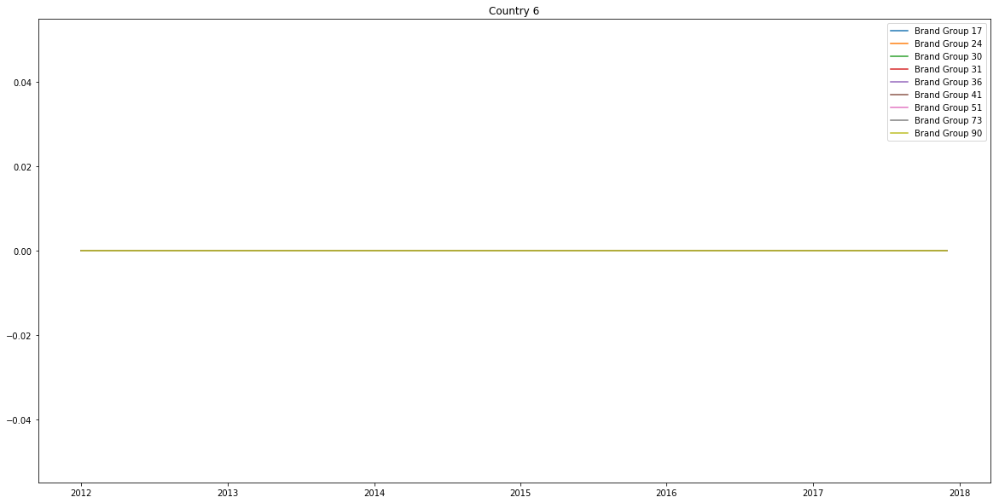

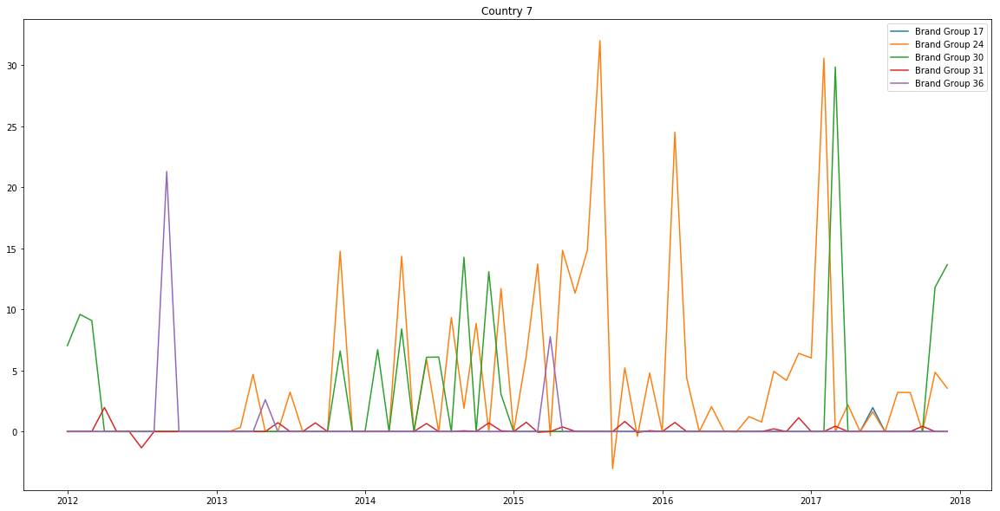

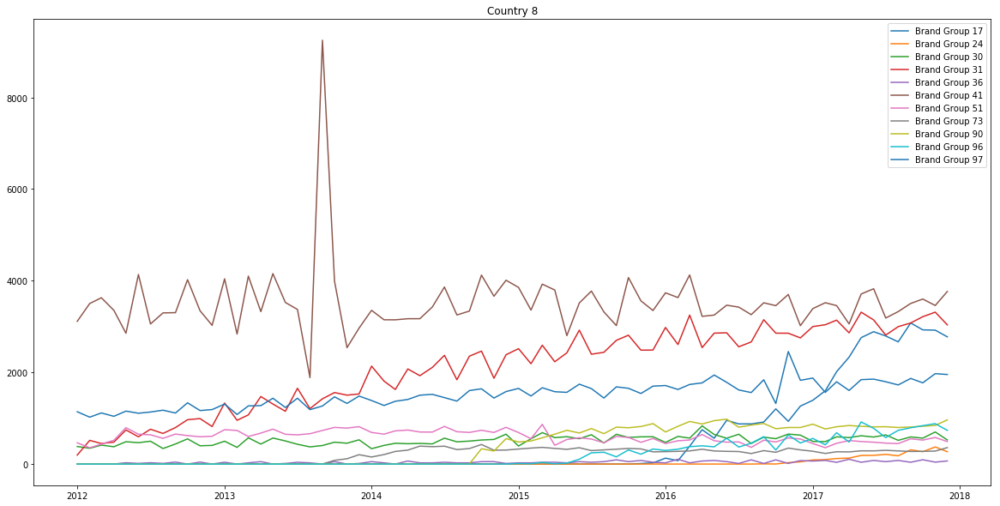

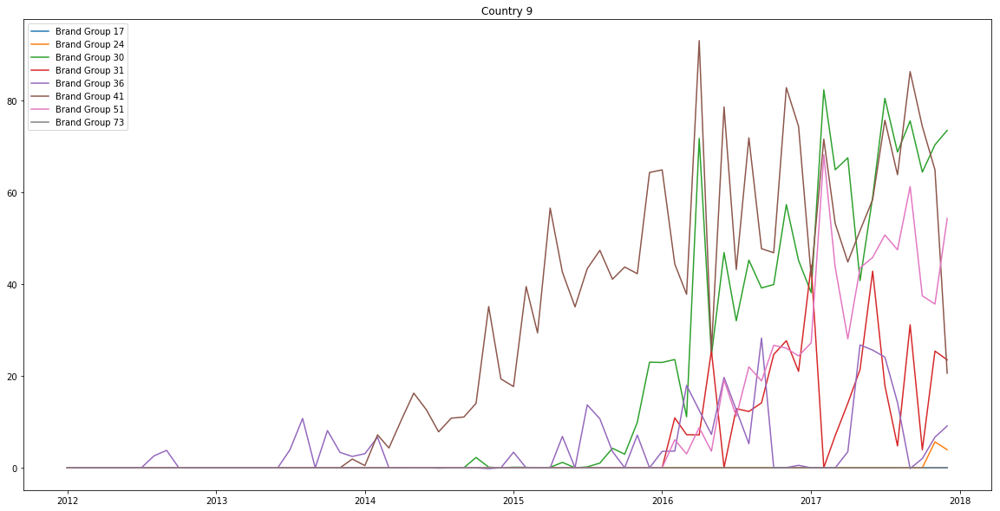

In [169]:
sub_countries = [country for country in countries]
sub_countries.sort()

plot_id = 0

for country in countries:
    # some issue appears on 31 index, claiming that data is not a timeseries, double checked and it is
    for brand in selected_brand_groups:
        df_index = data.index.get_level_values(2) == country
        df = data[df_index]
        df = df[df.index.get_level_values(1) == brand]
        
        if len(df > 0) and len(df) != sum(df.isna()['Sales 2']):
            plt.figure(plot_id)
            plt.plot(df.index.get_level_values(3).sort_values(), df['Sales 2'].sort_index())
            plt.title(country)
            plt.legend(selected_brand_groups)
    plot_id += 1

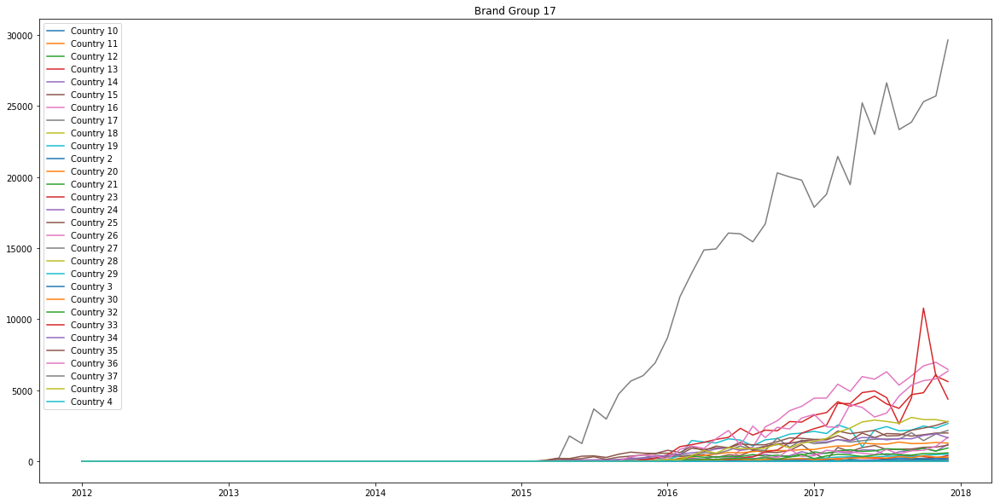

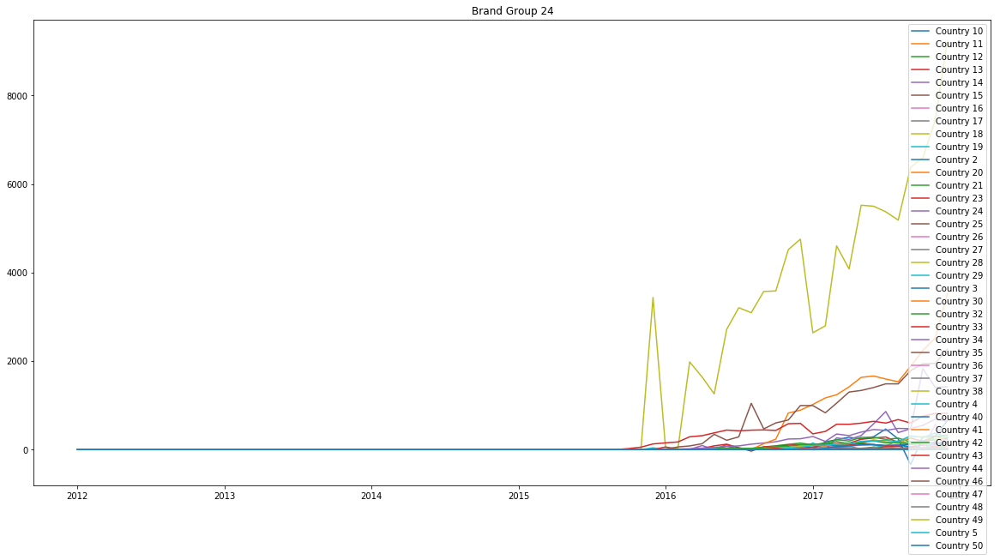

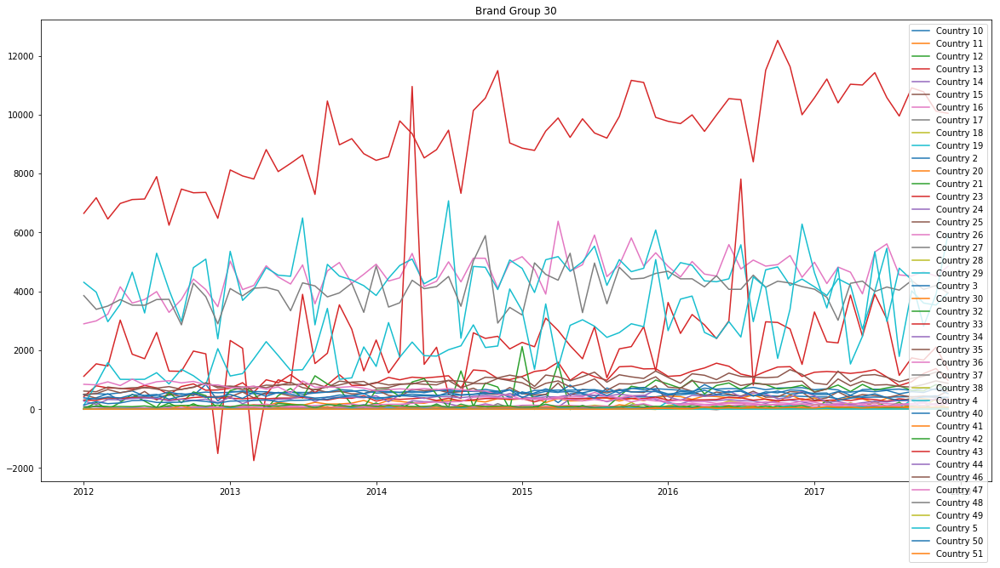

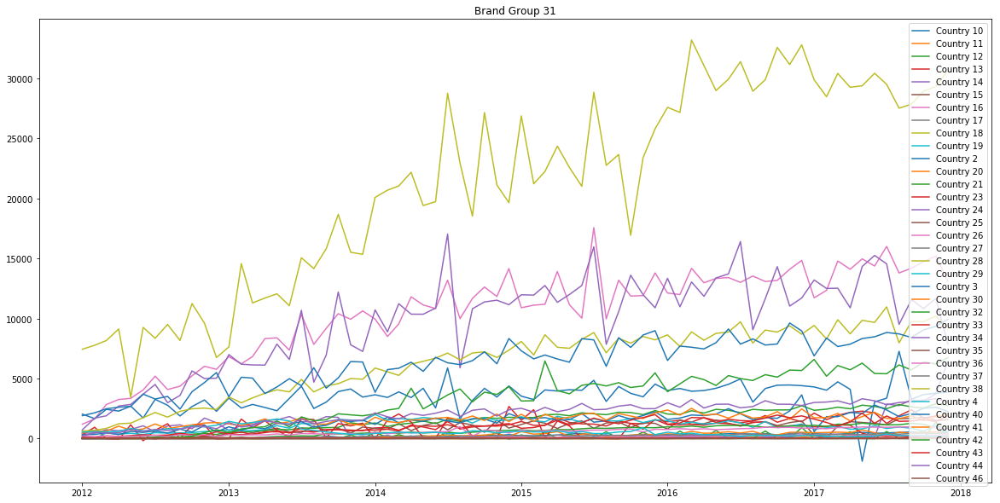

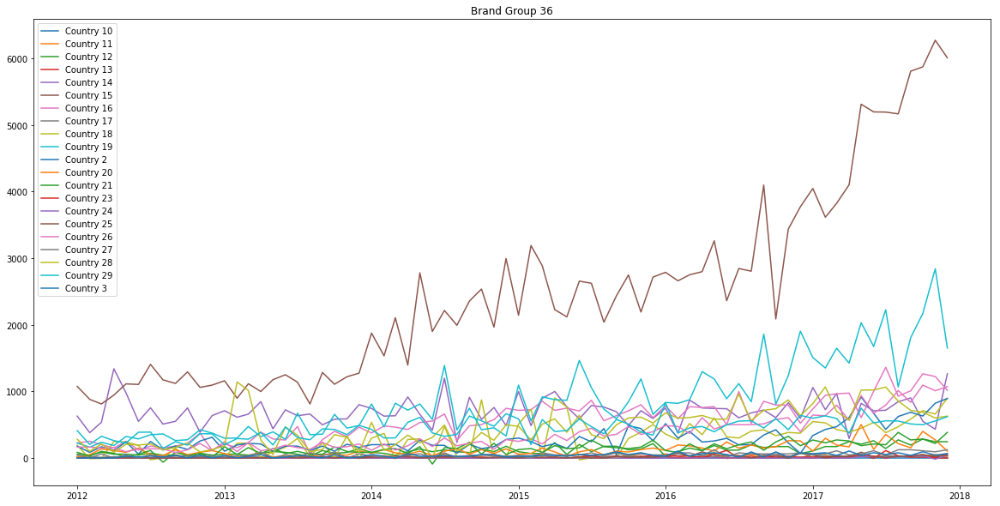

...

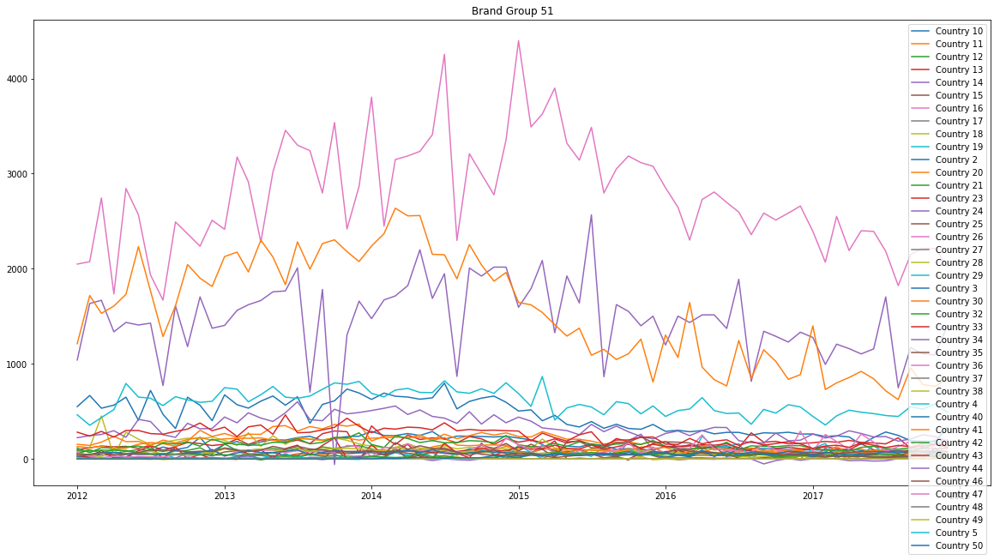

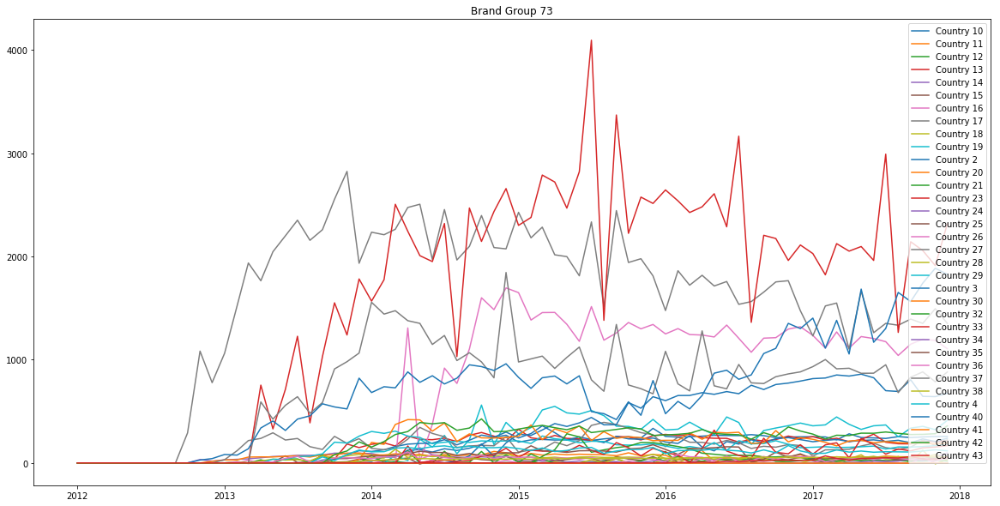

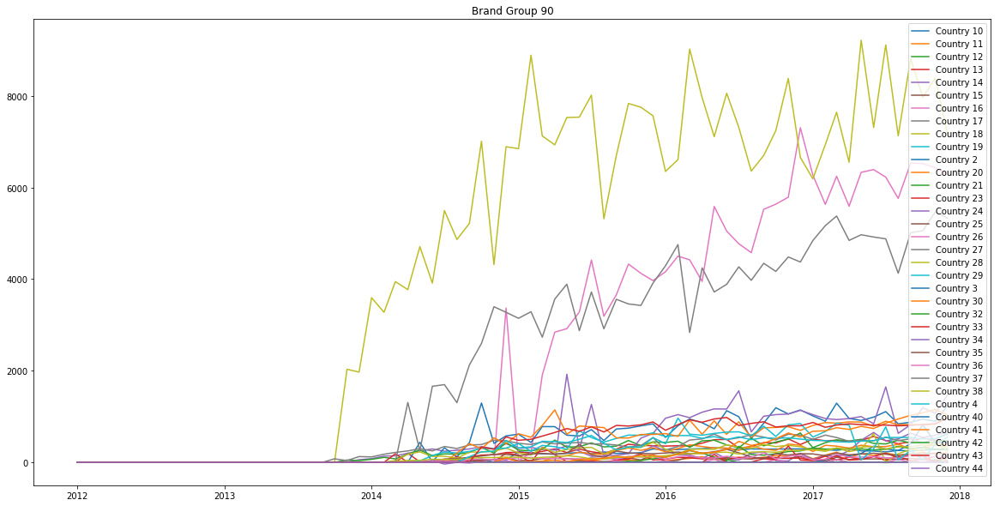

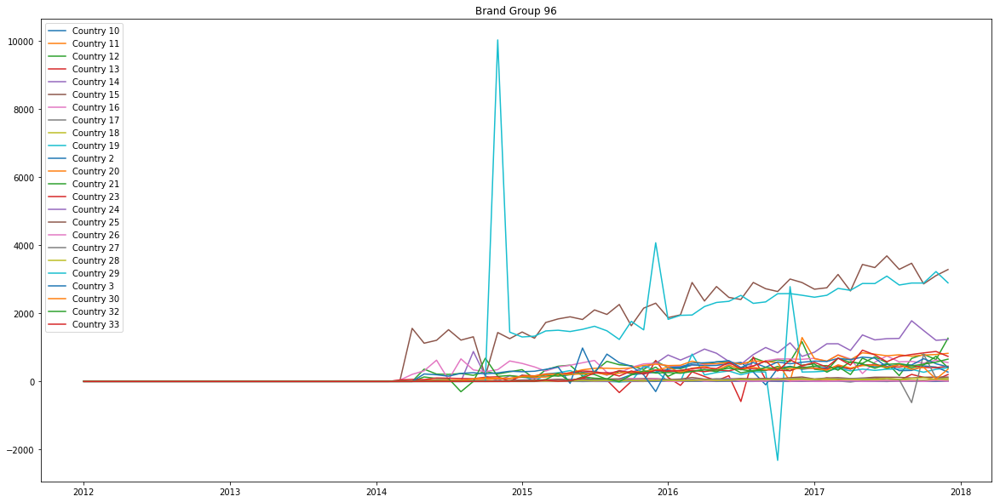

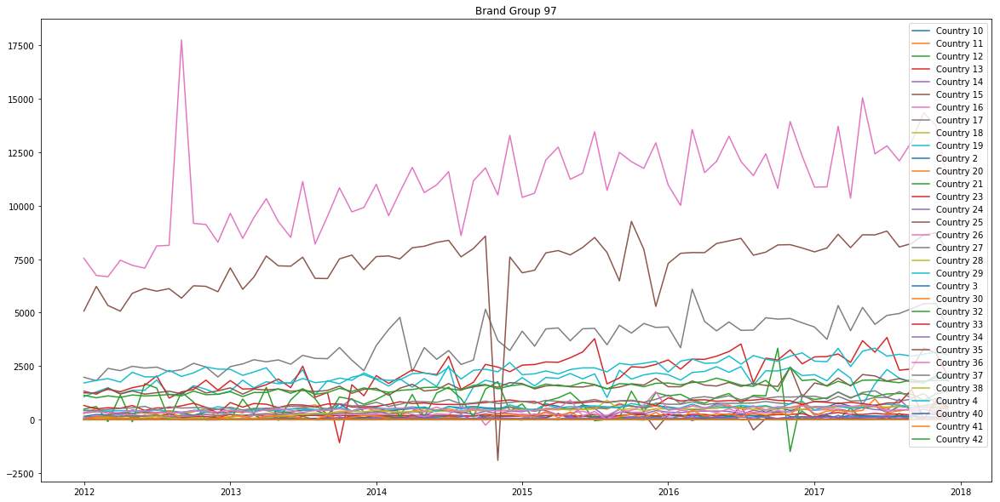

In [178]:
plot_id = 0

for brand in selected_brand_groups:
    for country in countries:
        df_index = data.index.get_level_values(1) == brand
        df = data[df_index]
        df = df[df.index.get_level_values(2) == country]
        
        if len(df > 0) and len(df) != sum(df.isna()['Sales 2']):
            plt.figure(plot_id)
            plt.plot(df.index.get_level_values(3).sort_values(), df['Sales 2'].sort_index())
            plt.title(brand)
            plt.legend(countries)
    plot_id += 1

#### Investments vs Revenue

In [222]:
simple_data = data.copy()
simple_data = simple_data.reset_index()

simple_data_monthly_sum = simple_data.groupby('date').sum()
# simple_data_monthly_sum.head()

,Investment 1,Investment 2,Investment 3,Investment 4,Investment 5,Investment 6,Sales 1,Sales 2,month_num
date,,,,,,,,,
2012-01-01,-33142.805077,-12213.287805,-1237.436119,-469.986500,-890.538373,-3680.788366,512001.954148,435014.167086,1184
2012-02-01,-33108.754388,-14854.652700,-455.163025,-518.053020,-913.837342,-4458.014118,506835.265383,424348.308345,2368
2012-03-01,-34511.811443,-23193.079574,-1883.935200,-2347.566235,-1152.004582,-4645.129320,548130.405503,460838.422408,3552
2012-04-01,-33242.501422,-22947.831227,-530.614849,-296.891651,-1162.359679,-4549.139068,528369.488597,446310.487136,4736
2012-05-01,-29168.883709,-22741.221354,-716.276498,-1202.809403,-996.678121,-3869.620463,567993.131424,492829.309330,5920


Text(0.5, 1.0, 'Total sales(regularised) vs Total investment')

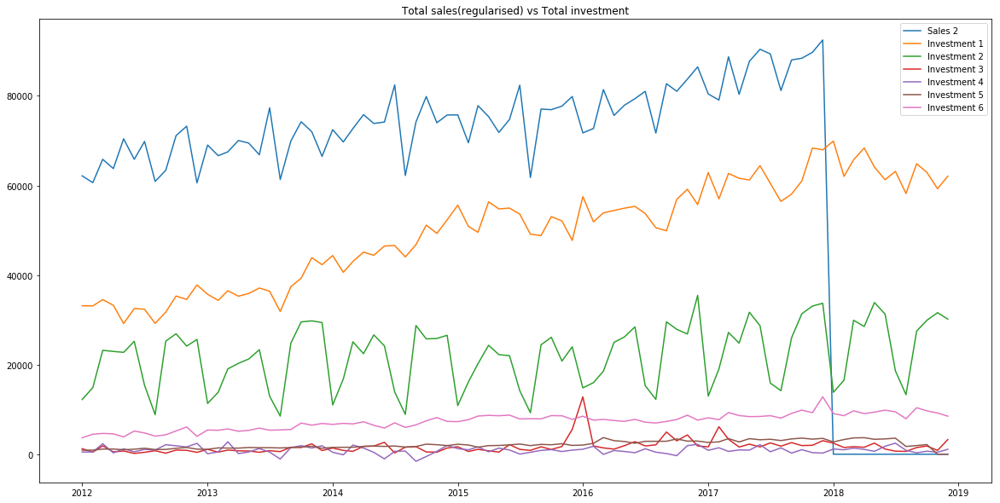

In [237]:
plt.plot(simple_data_monthly_sum.index, simple_data_monthly_sum['Sales 2']/7 )
plt.plot(simple_data_monthly_sum.index, -simple_data_monthly_sum['Investment 1'])
plt.plot(simple_data_monthly_sum.index, -simple_data_monthly_sum['Investment 2'])
plt.plot(simple_data_monthly_sum.index, -simple_data_monthly_sum['Investment 3'])
plt.plot(simple_data_monthly_sum.index, -simple_data_monthly_sum['Investment 4'])
plt.plot(simple_data_monthly_sum.index, -simple_data_monthly_sum['Investment 5'])
plt.plot(simple_data_monthly_sum.index, -simple_data_monthly_sum['Investment 6'])
plt.legend()
plt.title("Total sales(regularised) vs Total investment")